# <-----CVPR FINAL PROJECT-----> <br />
<h4>Md. Ishtiyak Ali Rifat ---------> 18-37927-2</h4> 
<h4>Ehsanul Ahmed --------->   18-37857-2</h4>   
<h4>Md Abdus Sobhan --------->   18-37855-2</h4>   
<h4>Atiqullah Habib --------->   19-40022-1</h4>   

In [1]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import LearningRateScheduler, ReduceLROnPlateau

import os
import cv2
from os import walk
import glob as gb
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
SEED = 1000
IMG_SIZE = 50
BATCH_SIZE = 128

TRAIN_DIR = 'F:/AIUB/CPVR/dataset/butterfly/butterflies/train'
VALID_DIR = 'F:/AIUB/CPVR/dataset/butterfly/butterflies/valid'
TEST_DIR = 'F:/AIUB/CPVR/dataset/butterfly/butterflies/test'

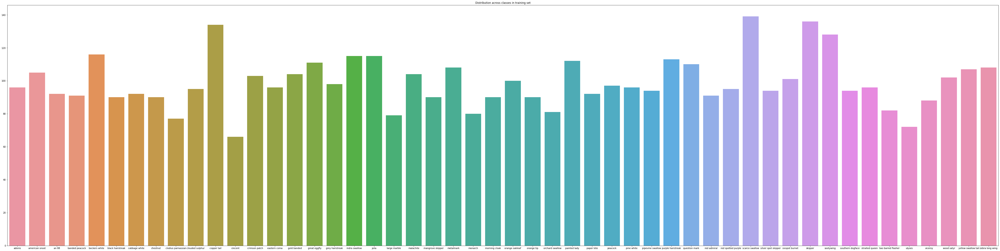

Total Train Examples = 4955


In [3]:
class_names = []
class_count = []
TRAIN_EXAMPLES = 0
for folder in  os.listdir(TRAIN_DIR) : 
    files = gb.glob(pathname= str( TRAIN_DIR + '//' + folder + '/*.jpg'))
    class_names.append(folder)
    class_count.append(len(files))
    TRAIN_EXAMPLES += len(files)
plt.figure(figsize=(80,20))    
sns.barplot(x = class_names, y=class_count).set_title("Distribution across classes in training set")
plt.show()

print(f'Total Train Examples = {TRAIN_EXAMPLES}')

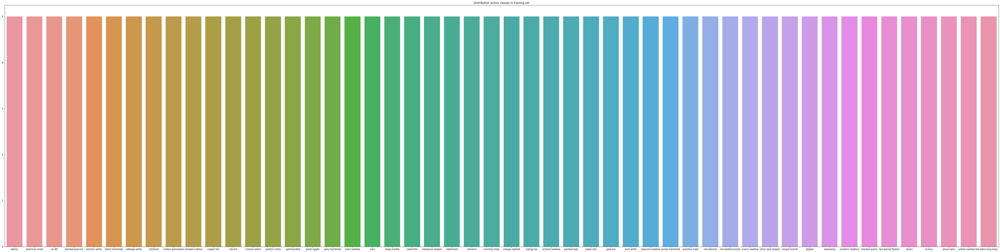

Total Train Examples = 250


In [4]:
class_names = []
class_count = []
VALIDATION_EXAMPLES = 0
for folder in  os.listdir(VALID_DIR) : 
    files = gb.glob(pathname= str( VALID_DIR + '//' + folder + '/*.jpg'))
    class_names.append(folder)
    class_count.append(len(files))
    VALIDATION_EXAMPLES += len(files)
    
plt.figure(figsize=(80,20)) 
sns.barplot(x = class_names, y=class_count).set_title("Distribution across classes in training set")
plt.show()

print(f'Total Train Examples = {VALIDATION_EXAMPLES}')

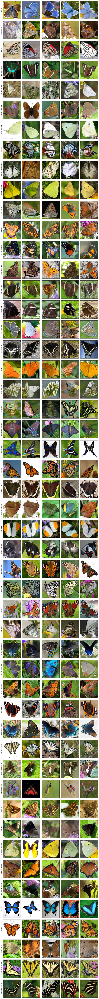

In [5]:
plt.figure(figsize=(10,100))
i=0
for c in os.listdir(TRAIN_DIR):  
    path = os.path.join(TRAIN_DIR,c)
    for img in os.listdir(path):
        img_array = cv2.cvtColor(cv2.imread(os.path.join(path,img)), cv2.COLOR_BGR2RGB) 
        plt.subplot(50,5,i+1)
        plt.imshow(img_array)
        if i%5 == 0:
            plt.ylabel(c)
        plt.xticks([])
        plt.yticks([])
        i += 1
        if i%5 == 0:
            break

plt.tight_layout()        
plt.show() 

In [6]:
train_gen = ImageDataGenerator(
    featurewise_center=False,
    samplewise_center=False,
    featurewise_std_normalization=False,
    samplewise_std_normalization=False,
    zca_whitening=False,
    zca_epsilon=1e-06,
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.3,
    channel_shift_range=0.,
    fill_mode='nearest',
    cval=0.,
    horizontal_flip=True,
    vertical_flip=False,
    rescale=None,
    preprocessing_function=tf.keras.applications.resnet50.preprocess_input,
    data_format=None,
    validation_split=0.0,
    dtype=tf.float32,
)

test_gen = ImageDataGenerator(
    preprocessing_function= tf.keras.applications.resnet50.preprocess_input, 
    dtype=tf.float32
)

In [7]:
train_batch = train_gen.flow_from_directory(
    directory = TRAIN_DIR,
    target_size = (IMG_SIZE,IMG_SIZE),
    batch_size = BATCH_SIZE,
    class_mode = 'sparse',
    seed = SEED
)

Found 4955 images belonging to 50 classes.


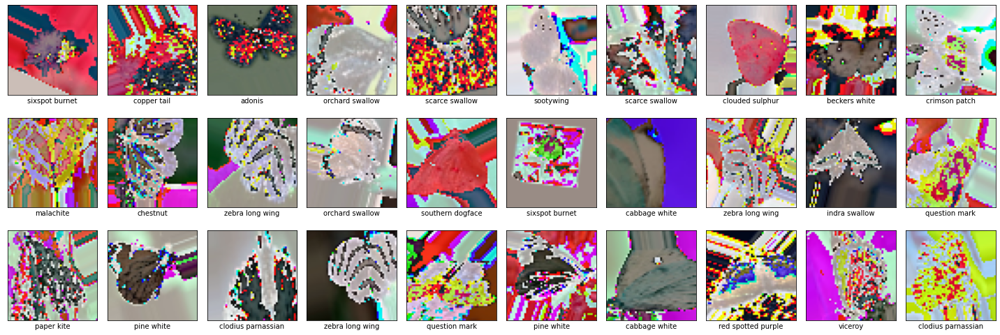

In [8]:
imgs, labels = next(train_batch)
i = 0
plt.figure(figsize=(20,7))
for img, label in zip(imgs, labels):
    plt.subplot(3,10,i+1)
    plt.imshow(img.astype('uint8'))
    plt.xticks([])
    plt.yticks([])
    plt.xlabel(class_names[label.astype('int32')])
    i+=1
    if i == 30:
        break
plt.tight_layout()
plt.show()

In [9]:
valid_batch = train_gen.flow_from_directory(
    directory = VALID_DIR,
    target_size = (IMG_SIZE,IMG_SIZE),
    batch_size = BATCH_SIZE,
    class_mode = 'sparse',
    seed = SEED
)

Found 250 images belonging to 50 classes.


In [10]:
test_batch = test_gen.flow_from_directory(
    directory = VALID_DIR,
    target_size = (IMG_SIZE,IMG_SIZE),
    batch_size = BATCH_SIZE,
    class_mode = None,
    seed = SEED
)

Found 250 images belonging to 50 classes.


In [11]:
def identity_block(X, filters):
    f1, f2, f3 = filters
    X_copy = X
    

    X = layers.Conv2D(filters=f1, kernel_size=(1,1), strides=(1,1), padding='valid')(X)
    X = layers.BatchNormalization(axis=3)(X)
    X = layers.Activation('relu')(X)
    
    X = layers.Conv2D(filters=f2, kernel_size=(3,3), strides=(1,1), padding='same')(X)
    X = layers.BatchNormalization(axis=3)(X)
    X = layers.Activation('relu')(X) 
    
    X = layers.Conv2D(filters=f3, kernel_size=(1,1), strides=(1,1), padding='valid')(X)
    X = layers.BatchNormalization(axis=3)(X)
    
    X = layers.Add()([X, X_copy])
    X = layers.Activation('relu')(X)
    
    return X

In [12]:
def conv_blocks(X, filters, s=2):
    f1, f2, f3 = filters
    X_copy = X
    
    X = layers.Conv2D(filters=f1, kernel_size=(1,1), strides=(s,s), padding='valid')(X)
    X = layers.BatchNormalization(axis=3)(X)
    X = layers.Activation('relu')(X)
    
    X = layers.Conv2D(filters=f2, kernel_size=(3,3), strides=(1,1), padding='same')(X)
    X = layers.BatchNormalization(axis=3)(X)
    X = layers.Activation('relu')(X) 
    
    X = layers.Conv2D(filters=f3, kernel_size=(1,1), strides=(1,1), padding='valid')(X)
    X = layers.BatchNormalization(axis=3)(X)
    
    X_copy = layers.Conv2D(filters=f3, kernel_size=(1,1), strides=(s,s), padding='valid')(X_copy)
    X_copy = layers.BatchNormalization(axis=3)(X_copy)
    
    X = layers.Add()([X, X_copy])
    X = layers.Activation('relu')(X)
    
    return X

In [13]:
def ResNet50():
    X_input = keras.Input((IMG_SIZE, IMG_SIZE, 3))
    X = layers.ZeroPadding2D((3,3))(X_input)
    
    X = layers.Conv2D(64, (7,7), strides=(2,2))(X)
    X = layers.BatchNormalization(axis=3)(X)
    X = layers.Activation('relu')(X) 
    X = layers.MaxPooling2D((3,3), strides=(2,2))(X)
    
    X = conv_blocks(X, filters=[64,64,256], s=1)
    X = identity_block(X, filters=[64,64,256])
    X = identity_block(X, filters=[64,64,256])
    
    X = conv_blocks(X, filters=[128,128,512], s=2)
    X = identity_block(X, filters=[128,128,512])
    X = identity_block(X, filters=[128,128,512])
    X = identity_block(X, filters=[128,128,512])
    
    X = conv_blocks(X, filters=[256,256,1024], s=2)
    X = identity_block(X, filters=[256,256,1024])
    X = identity_block(X, filters=[256,256,1024])
    X = identity_block(X, filters=[256,256,1024])
    X = identity_block(X, filters=[256,256,1024])
    X = identity_block(X, filters=[256,256,1024])
    
    X = conv_blocks(X, filters=[512,512,2048], s=2)
    X = identity_block(X, filters=[512,512,2048])
    X = identity_block(X, filters=[512,512,2048])
    
    X = layers.AveragePooling2D((2,2))(X)
    X = layers.Flatten()(X)
    X = layers.Dense(50, activation='softmax', kernel_initializer='he_normal')(X)
    
    model = keras.Model(inputs=X_input, outputs=X, name='ResNet50')
    
    return model

In [14]:
model = ResNet50()
model.summary()

Model: "ResNet50"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 50, 50, 3)]  0                                            
__________________________________________________________________________________________________
zero_padding2d (ZeroPadding2D)  (None, 56, 56, 3)    0           input_1[0][0]                    
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 25, 25, 64)   9472        zero_padding2d[0][0]             
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 25, 25, 64)   256         conv2d[0][0]                     
___________________________________________________________________________________________

In [15]:
def lr_schedule(epoch):
    lr = 1e-3
    if epoch > 40:
        lr *= 0.5e-3
    elif epoch > 30:
        lr *= 1e-3
    elif epoch > 20:
        lr *= 1e-2
    elif epoch > 10:
        lr *= 1e-1
    print('Learning rate: ', lr)
    return lr
lr_scheduler = LearningRateScheduler(lr_schedule)

In [16]:
model.compile(
    optimizer=keras.optimizers.Adam(lr=lr_schedule(0)), 
    loss='sparse_categorical_crossentropy', 
    metrics=['accuracy']
)

Learning rate:  0.001


c:\anaconda\envs\final-term\lib\site-packages\keras\optimizer_v2\optimizer_v2.py:355: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  warnings.warn(


In [17]:
h = model.fit(train_batch, 
              epochs=50,
              steps_per_epoch = TRAIN_EXAMPLES // BATCH_SIZE,
              validation_data = valid_batch,
              validation_steps = VALIDATION_EXAMPLES // BATCH_SIZE,
              callbacks=lr_scheduler,
              verbose=2
             )

Epoch 1/50
Learning rate:  0.001
38/38 - 25s - loss: 4.7224 - accuracy: 0.0570 - val_loss: 112.7012 - val_accuracy: 0.0078
Epoch 2/50
Learning rate:  0.001
38/38 - 10s - loss: 3.1711 - accuracy: 0.1668 - val_loss: 4.0009 - val_accuracy: 0.0625
Epoch 3/50
Learning rate:  0.001
38/38 - 10s - loss: 2.7987 - accuracy: 0.2434 - val_loss: 3.5408 - val_accuracy: 0.0469
Epoch 4/50
Learning rate:  0.001
38/38 - 10s - loss: 2.7108 - accuracy: 0.2759 - val_loss: 33.7739 - val_accuracy: 0.1172
Epoch 5/50
Learning rate:  0.001
38/38 - 11s - loss: 3.1590 - accuracy: 0.2430 - val_loss: 5103.7881 - val_accuracy: 0.0234
Epoch 6/50
Learning rate:  0.001
38/38 - 11s - loss: 2.8452 - accuracy: 0.2629 - val_loss: 390.4701 - val_accuracy: 0.0547
Epoch 7/50
Learning rate:  0.001
38/38 - 11s - loss: 2.3082 - accuracy: 0.3514 - val_loss: 3.8000 - val_accuracy: 0.2422
Epoch 8/50
Learning rate:  0.001
38/38 - 12s - loss: 2.3195 - accuracy: 0.3783 - val_loss: 11.7638 - val_accuracy: 0.1719
Epoch 9/50
Learning rat

In [18]:
from glob import glob
training_dir=TRAIN_DIR
validation_dir=VALID_DIR
image_files = glob(training_dir + '/*/*')
valid_image_files = glob(validation_dir + '/*/*')

In [19]:
folders = glob(training_dir + '/*')
num_classes = len(folders)
print ('Total Classes = ' + str(num_classes))

Total Classes = 50


In [20]:
from keras.models import Model
from keras.layers import Flatten, Dense
from tensorflow.keras.applications.vgg16 import VGG16

IMG_SIZE=80

IMAGE_SIZE = [IMG_SIZE, IMG_SIZE] 


vgg = VGG16(input_shape = IMAGE_SIZE + [3], weights = 'imagenet', include_top = False) 


for layer in vgg.layers:
    layer.trainable = False

x = Flatten()(vgg.output)

x = Dense(num_classes, activation = 'softmax')(x)  

model = Model(inputs = vgg.input, outputs = x)

model.compile(
    loss='sparse_categorical_crossentropy', 
    optimizer='Adam', 
    metrics=['accuracy']
)

In [21]:
model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 80, 80, 3)]       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 80, 80, 64)        1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 80, 80, 64)        36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 40, 40, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 40, 40, 128)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 40, 40, 128)       147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 20, 20, 128)       0     

In [22]:
from keras.applications.vgg16 import preprocess_input

training_datagen = ImageDataGenerator(
                                    rescale=1./255,
                                    shear_range=0.2, 
                                    zoom_range=0.2,
                                    horizontal_flip=False,
                                    preprocessing_function=preprocess_input)

validation_datagen = ImageDataGenerator(rescale = 1./255, preprocessing_function=preprocess_input)

training_generator = training_datagen.flow_from_directory(
    training_dir, 
    target_size = IMAGE_SIZE, 
    batch_size = BATCH_SIZE, 
    class_mode = 'sparse')

validation_generator = validation_datagen.flow_from_directory(
    validation_dir, 
    target_size = IMAGE_SIZE, 
    batch_size = BATCH_SIZE, 
    class_mode = 'sparse')

Found 4955 images belonging to 50 classes.
Found 250 images belonging to 50 classes.


In [23]:
training_images = 4955// BATCH_SIZE
validation_images = 250

history = model.fit(training_generator,
                   steps_per_epoch = training_images,
                   epochs = 50,
                   validation_data = validation_generator,
                   )

Epoch 1/50
38/38 [==============================] - 127s 3s/step - loss: 3.1365 - accuracy: 0.2650 - val_loss: 2.2752 - val_accuracy: 0.5320
Epoch 2/50
38/38 [==============================] - 42s 1s/step - loss: 1.8683 - accuracy: 0.6032 - val_loss: 1.5736 - val_accuracy: 0.6640
Epoch 3/50
38/38 [==============================] - 53s 1s/step - loss: 1.3810 - accuracy: 0.7151 - val_loss: 1.2852 - val_accuracy: 0.7000
Epoch 4/50
38/38 [==============================] - 54s 1s/step - loss: 1.1455 - accuracy: 0.7499 - val_loss: 1.1161 - val_accuracy: 0.7120
Epoch 5/50
38/38 [==============================] - 45s 1s/step - loss: 0.9977 - accuracy: 0.7835 - val_loss: 1.0020 - val_accuracy: 0.7720
Epoch 6/50
38/38 [==============================] - 51s 1s/step - loss: 0.8658 - accuracy: 0.8181 - val_loss: 0.9444 - val_accuracy: 0.7400
Epoch 7/50
38/38 [==============================] - 52s 1s/step - loss: 0.7917 - accuracy: 0.8307 - val_loss: 0.8698 - val_accuracy: 0.7720
Epoch 8/50
38/38 [=

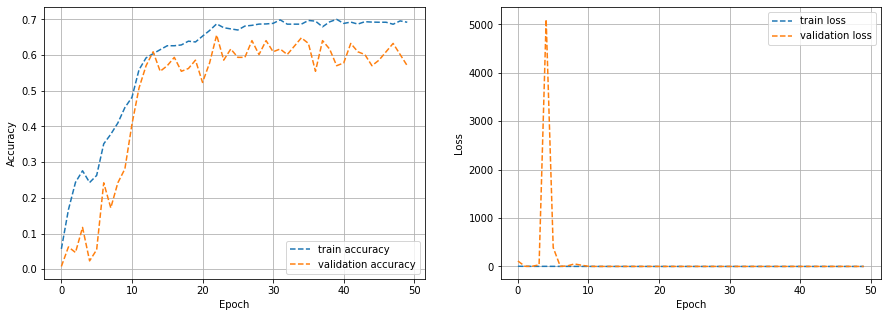

In [24]:
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.plot(h.history['accuracy'], '--', label='train accuracy')
plt.plot(h.history['val_accuracy'], '--', label = 'validation accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.grid(True)
plt.legend(loc='lower right')

plt.subplot(1,2,2)
plt.plot(h.history['loss'], '--', label='train loss')
plt.plot(h.history['val_loss'], '--', label='validation loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.grid(True)
plt.legend(loc='upper right')

plt.show()

# <-----Custom Model----->

In [25]:
CATEGORIES = []
for c in os.listdir(TRAIN_DIR):
    CATEGORIES.append(c)
print (CATEGORIES)

['adonis', 'american snoot', 'an 88', 'banded peacock', 'beckers white', 'black hairstreak', 'cabbage white', 'chestnut', 'clodius parnassian', 'clouded sulphur', 'copper tail', 'crecent', 'crimson patch', 'eastern coma', 'gold banded', 'great eggfly', 'grey hairstreak', 'indra swallow', 'julia', 'large marble', 'malachite', 'mangrove skipper', 'metalmark', 'monarch', 'morning cloak', 'orange oakleaf', 'orange tip', 'orchard swallow', 'painted lady', 'paper kite', 'peacock', 'pine white', 'pipevine swallow', 'purple hairstreak', 'question mark', 'red admiral', 'red spotted purple', 'scarce swallow', 'silver spot skipper', 'sixspot burnet', 'skipper', 'sootywing', 'southern dogface', 'straited queen', 'two barred flasher', 'ulyses', 'viceroy', 'wood satyr', 'yellow swallow tail', 'zebra long wing']


In [26]:
from tqdm import tqdm

IMG_SIZE = 64
train_data=[]
for c in CATEGORIES:
    path = os.path.join (TRAIN_DIR,c)
    class_num = CATEGORIES.index(c)
    for img in tqdm(os.listdir (path)):
        try:
            img_arr = cv2.imread(os.path.join(path,img))
            img_resized = cv2.resize (img_arr,(IMG_SIZE, IMG_SIZE))
            train_data.append ([img_resized, class_num])
        except Exception as e:
            pass

print (len(train_data))

100%|███████████████████████████████████████████████████████████████████████████████| 108/108 [00:00<00:00, 324.22it/s]

4955


In [27]:
test_data=[]
for c in CATEGORIES:
    path = os.path.join (TEST_DIR,c)
    class_num = CATEGORIES.index(c)
    for img in tqdm(os.listdir(path)):
        try:
            img_arr = cv2.imread(os.path.join(path,img))
            img_resized = cv2.resize (img_arr,(IMG_SIZE, IMG_SIZE))
            test_data.append ([img_resized, class_num])
        except Exception as e:
            pass

print (len(test_data))

100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 91.09it/s]

250


In [28]:
valid_data=[]
for c in CATEGORIES:
    path = os.path.join (VALID_DIR,c)
    class_num = CATEGORIES.index(c)
    for img in tqdm(os.listdir(path)):
        try:
            img_arr = cv2.imread(os.path.join(path,img))
            img_resized = cv2.resize (img_arr,(IMG_SIZE, IMG_SIZE))
            valid_data.append ([img_resized, class_num])
        except Exception as e:
            pass

print (len(valid_data))

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 358.07it/s]

250


In [29]:
import random
random.shuffle (train_data)
random.shuffle (test_data)
random.shuffle (valid_data)

(4955, 64, 64, 3) (4955,)


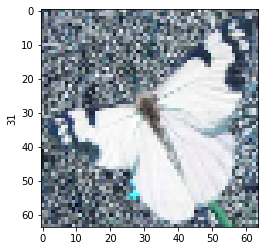

In [30]:
X_train = []
Y_train = []
for img,label in train_data:
    X_train.append (img)
    Y_train.append (label)

X_train = np.array(X_train).astype('float32').reshape (-1,IMG_SIZE,IMG_SIZE,3)
Y_train = np.array (Y_train)

print (X_train.shape, Y_train.shape)
plt.figure()
plt.imshow(X_train[2000].astype('uint8'))
plt.ylabel(Y_train[2000])
plt.show()

In [31]:
X_test = []
Y_test = []
for img,label in test_data:
    X_test.append (img)
    Y_test.append (label)

X_test = np.array(X_test).astype('float32').reshape (-1,IMG_SIZE,IMG_SIZE,3)
Y_test = np.array (Y_test)

print (X_test.shape, Y_test.shape)

(250, 64, 64, 3) (250,)


In [32]:
X_valid = []
Y_valid = []
for img,label in valid_data:
    X_valid.append (img)
    Y_valid.append (label)

X_valid = np.array(X_valid).astype('float32').reshape (-1,IMG_SIZE,IMG_SIZE,3)
Y_valid = np.array (Y_valid)

print (X_valid.shape, Y_valid.shape)

(250, 64, 64, 3) (250,)


In [33]:
mean_rgb = np.mean(X_train, axis=(0,1,2))
print(mean_rgb)

[ 80.47071 115.97447 119.16081]


In [34]:
X_train_norm = np.empty_like(X_train)
X_test_norm = np.empty_like(X_test)
X_valid_norm = np.empty_like(X_valid)

In [35]:
for i in range(len(X_train)):
    for c in range(3):
        if(c==1):
            X_train_norm[i,:, :, c] = X_train[i,:, :, c] - mean_rgb[0]
        elif(c==2):
            X_train_norm[i,:, :, c] = X_train[i,:, :, c] - mean_rgb[1]
        else:
            X_train_norm[i,:, :, c] = X_train[i,:, :, c] - mean_rgb[2]
            
for i in range(len(X_test)):
    for c in range(3):
        if(c==1):
            X_test_norm[i,:, :, c] = X_test[i,:, :, c] - mean_rgb[0]
        elif(c==2):
            X_test_norm[i,:, :, c] = X_test[i,:, :, c] - mean_rgb[1]
        else:
            X_test_norm[i,:, :, c] = X_test[i,:, :, c] - mean_rgb[2]


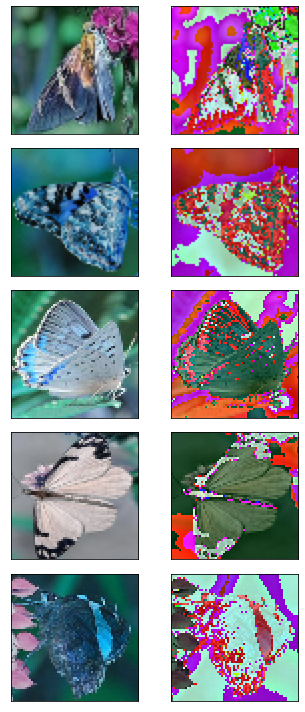

In [36]:
c = 0
plt.figure(figsize=(5,10))
for i in range(5):
    plt.subplot(5,2,c+1)
    plt.imshow(X_train[i].astype('uint8'))
    plt.xticks([])
    plt.yticks([])
    
    plt.subplot(5,2,c+2)
    plt.imshow(X_train_norm[i].astype('uint8'))
    plt.xticks([])
    plt.yticks([])

    c += 2
    
plt.tight_layout()
plt.show()

In [37]:
SPEC_SHAPE = (IMG_SIZE, IMG_SIZE)

model = tf.keras.Sequential([
    
    # First conv block
    tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(SPEC_SHAPE[0], SPEC_SHAPE[1], 3)),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D((2, 2)),
    
    # Second conv block
    tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D((2, 2)), 
    
    # Third conv block
    tf.keras.layers.Conv2D(128, (3, 3), activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D((2, 2)), 
    
    # Fourth conv block
    tf.keras.layers.Conv2D(256, (3, 3), activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D((2, 2)),
    
    # Global pooling instead of flatten()
    tf.keras.layers.GlobalAveragePooling2D(), 
    
    # Dense block
    #tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(256, activation='relu'),   
    tf.keras.layers.Dropout(0.2),  
    tf.keras.layers.Dense(512, activation='relu'),   
    tf.keras.layers.Dropout(0.2),
    # Classification layer
    tf.keras.layers.Dense(50, activation='softmax')
])

model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_53 (Conv2D)           (None, 62, 62, 32)        896       
_________________________________________________________________
batch_normalization_53 (Batc (None, 62, 62, 32)        128       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 31, 31, 32)        0         
_________________________________________________________________
conv2d_54 (Conv2D)           (None, 29, 29, 64)        18496     
_________________________________________________________________
batch_normalization_54 (Batc (None, 29, 29, 64)        256       
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 14, 14, 64)        0         
_________________________________________________________________
conv2d_55 (Conv2D)           (None, 12, 12, 128)       7

In [38]:
model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=0.001), 
    loss='sparse_categorical_crossentropy', 
    metrics=['accuracy']
)

In [39]:
from tensorflow.keras.callbacks import EarlyStopping

#cb = EarlyStopping(monitor='val_loss', min_delta=0.02, patience=3, restore_best_weights=True)

h = model.fit(x=X_train_norm, y=Y_train, 
              epochs=50, 
              validation_data=(X_valid, Y_valid),
              batch_size=BATCH_SIZE,
              verbose=2,
              #callbacks=[cb]
             )

Epoch 1/50
39/39 - 9s - loss: 2.6872 - accuracy: 0.2664 - val_loss: 10.6214 - val_accuracy: 0.0480
Epoch 2/50
39/39 - 6s - loss: 1.6893 - accuracy: 0.5019 - val_loss: 4.6992 - val_accuracy: 0.0840
Epoch 3/50
39/39 - 6s - loss: 1.2179 - accuracy: 0.6301 - val_loss: 2.4799 - val_accuracy: 0.3040
Epoch 4/50
39/39 - 6s - loss: 0.9355 - accuracy: 0.7092 - val_loss: 2.6409 - val_accuracy: 0.3120
Epoch 5/50
39/39 - 7s - loss: 0.7089 - accuracy: 0.7790 - val_loss: 2.8188 - val_accuracy: 0.2840
Epoch 6/50
39/39 - 8s - loss: 0.5239 - accuracy: 0.8335 - val_loss: 2.1374 - val_accuracy: 0.4400
Epoch 7/50
39/39 - 8s - loss: 0.3998 - accuracy: 0.8678 - val_loss: 2.9408 - val_accuracy: 0.2280
Epoch 8/50
39/39 - 10s - loss: 0.3032 - accuracy: 0.9033 - val_loss: 2.7029 - val_accuracy: 0.3200
Epoch 9/50
39/39 - 8s - loss: 0.2337 - accuracy: 0.9217 - val_loss: 3.0590 - val_accuracy: 0.4040
Epoch 10/50
39/39 - 10s - loss: 0.1812 - accuracy: 0.9415 - val_loss: 2.7409 - val_accuracy: 0.4120
Epoch 11/50
39/3

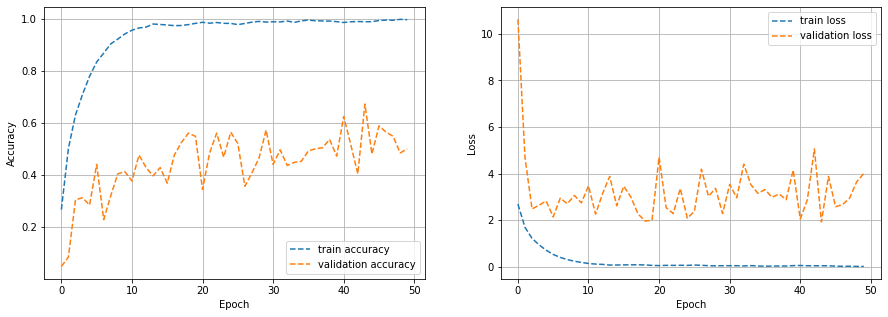

In [40]:
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.plot(h.history['accuracy'], '--', label='train accuracy')
plt.plot(h.history['val_accuracy'], '--', label = 'validation accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.grid(True)
plt.legend(loc='lower right')

plt.subplot(1,2,2)
plt.plot(h.history['loss'], '--', label='train loss')
plt.plot(h.history['val_loss'], '--', label='validation loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.grid(True)
plt.legend(loc='upper right')

plt.show()

# Filter Visualization of VGG16

In [41]:
import time
import functools
import IPython.display as display
from pathlib import Path
import random
from PIL import Image
from matplotlib import pyplot
import matplotlib as mpl

In [42]:
model = vgg
for i in range(len(model.layers)):
    layer = model.layers[i]
    if 'conv' not in layer.name:
        continue
    print(i, layer.name, layer.output.shape)

1 block1_conv1 (None, 80, 80, 64)
2 block1_conv2 (None, 80, 80, 64)
4 block2_conv1 (None, 40, 40, 128)
5 block2_conv2 (None, 40, 40, 128)
7 block3_conv1 (None, 20, 20, 256)
8 block3_conv2 (None, 20, 20, 256)
9 block3_conv3 (None, 20, 20, 256)
11 block4_conv1 (None, 10, 10, 512)
12 block4_conv2 (None, 10, 10, 512)
13 block4_conv3 (None, 10, 10, 512)
15 block5_conv1 (None, 5, 5, 512)
16 block5_conv2 (None, 5, 5, 512)
17 block5_conv3 (None, 5, 5, 512)


In [43]:
def load_img(path_to_img):
    max_dim = 512
    img = tf.io.read_file(path_to_img)
    img = tf.image.decode_image(img, channels=3)
    img = tf.image.convert_image_dtype(img, tf.float32)

    shape = tf.cast(tf.shape(img)[:-1], tf.float32)
    long_dim = max(shape)
    scale = max_dim / long_dim

    new_shape = tf.cast(shape * scale, tf.int32)

    img = tf.image.resize(img, new_shape)
    img = img[tf.newaxis, :]
    
    return img

In [44]:
def imshow(image, title=None):
    if len(image.shape) > 3:
        image = tf.squeeze(image, axis=0)

    plt.imshow(image)
    if title:
        plt.title(title)

Image shape: (1, 512, 512, 3)


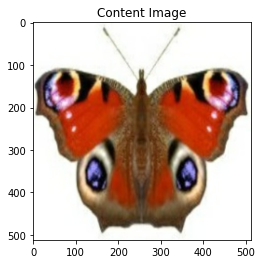

In [45]:
content_path = 'F:/AIUB/CPVR/dataset/butterfly/butterflies/train/peacock/47.jpg'
content_image = load_img(content_path)
print('Image shape:', content_image.shape)
imshow(content_image, 'Content Image')

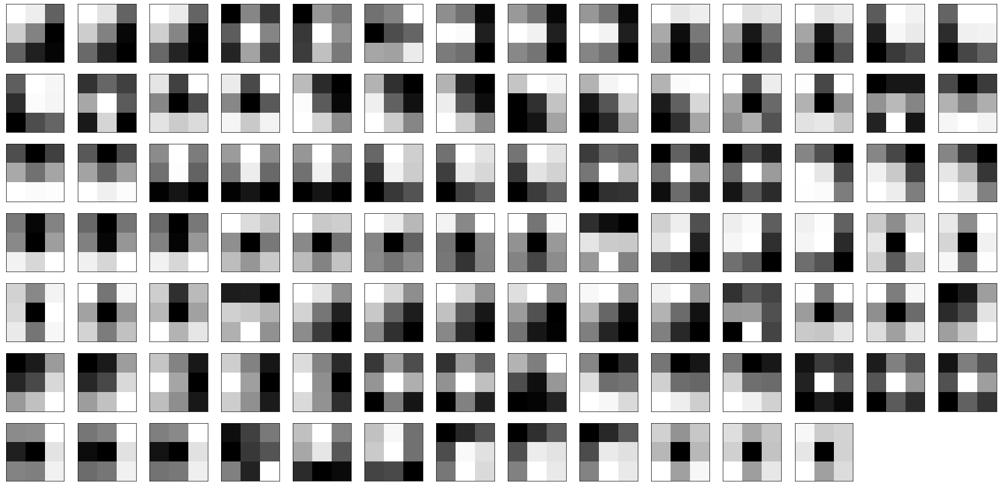

In [46]:
plt.figure(figsize=(32,32))

filters, biases = model.layers[1].get_weights()

f_min, f_max = filters.min(), filters.max()
filters = (filters - f_min) / (f_max - f_min)

n_filters, ix = 32, 1

for i in range(n_filters):
    f = filters[:, :, :, i]
    for j in range(3):
        ax = pyplot.subplot(14, 14, ix)
        ax.set_xticks([])
        ax.set_yticks([])
        pyplot.imshow(f[:, :, j], cmap='gray')
        ix += 1
pyplot.show()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 80, 80, 3)]       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 80, 80, 64)        1792      
Total params: 1,792
Trainable params: 0
Non-trainable params: 1,792
_________________________________________________________________


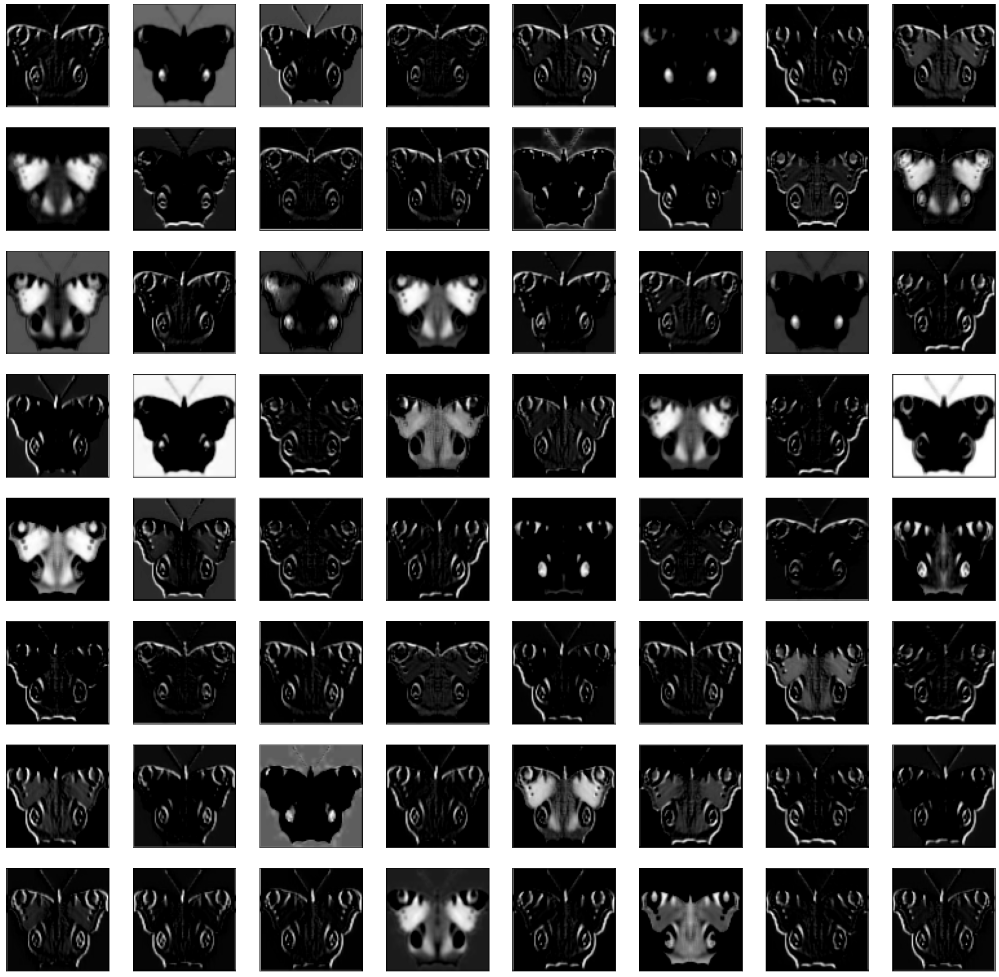

In [47]:
plt.figure(figsize=(32,32))

model = tf.keras.Model(inputs=[vgg.input], outputs=vgg.layers[1].output)
model.summary()

content_image = tf.keras.applications.vgg16.preprocess_input(content_image*255)
content_image = tf.image.resize(content_image, (80, 80))

feature_maps = model.predict(content_image)
square = 8
ix = 1
for _ in range(square):
    for _ in range(square):
        ax = pyplot.subplot(square, square, ix)
        ax.set_xticks([])
        ax.set_yticks([])
        pyplot.imshow(feature_maps[0, :, :, ix-1], cmap='gray')
        ix += 1
        
pyplot.show()

KerasTensor(type_spec=TensorSpec(shape=(None, 80, 80, 64), dtype=tf.float32, name=None), name='block1_conv2/Relu:0', description="created by layer 'block1_conv2'")


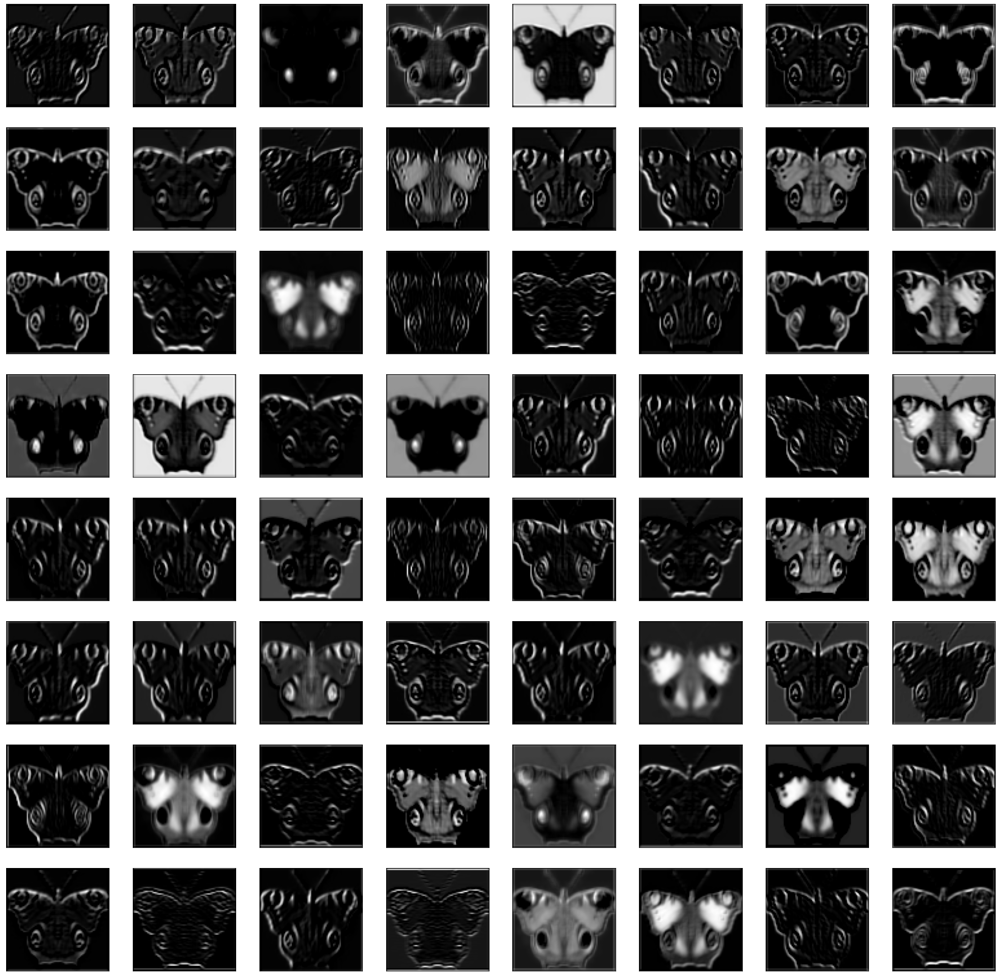

KerasTensor(type_spec=TensorSpec(shape=(None, 40, 40, 128), dtype=tf.float32, name=None), name='block2_conv2/Relu:0', description="created by layer 'block2_conv2'")


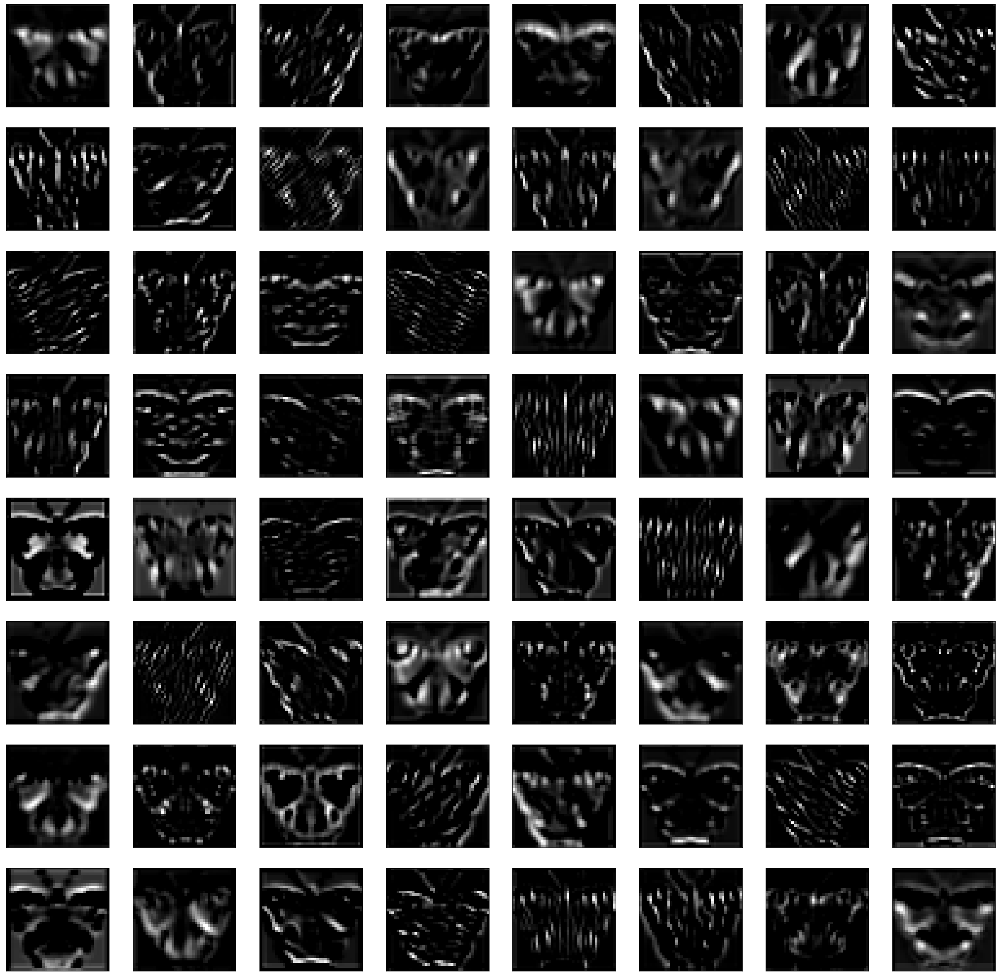

KerasTensor(type_spec=TensorSpec(shape=(None, 10, 10, 256), dtype=tf.float32, name=None), name='block3_pool/MaxPool:0', description="created by layer 'block3_pool'")


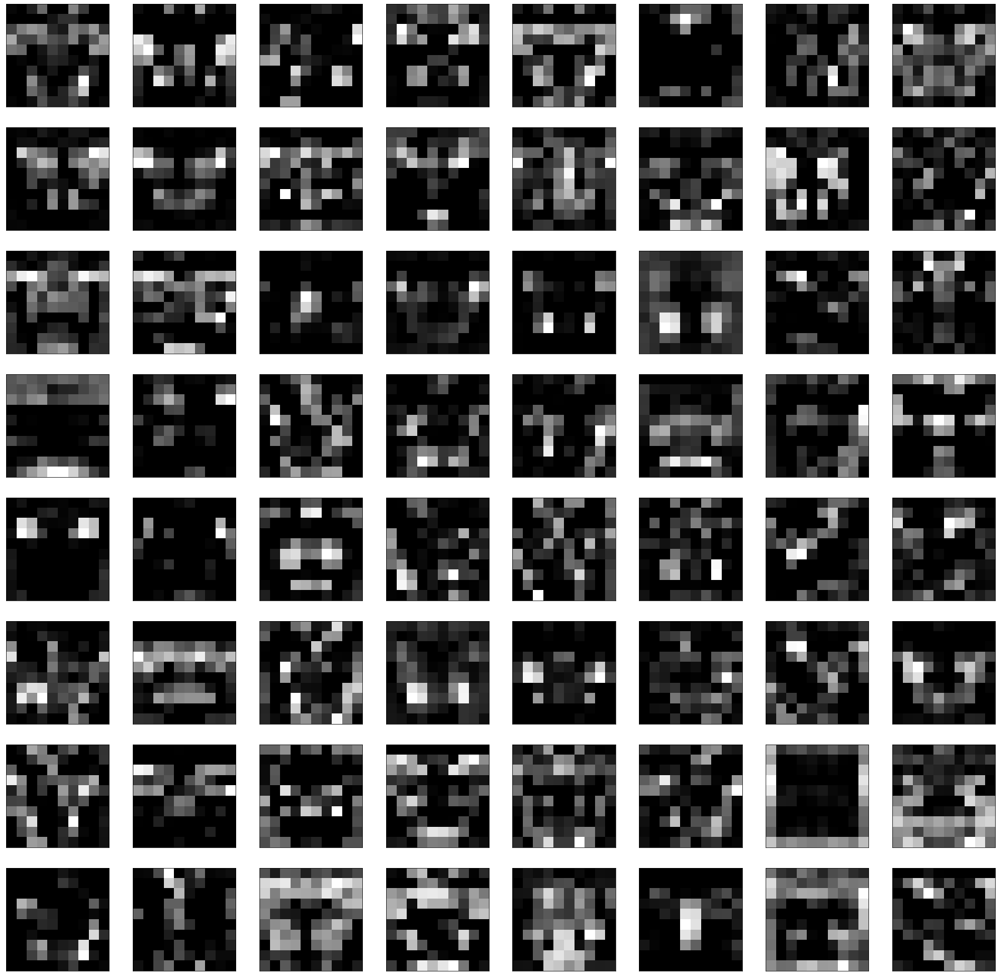

KerasTensor(type_spec=TensorSpec(shape=(None, 5, 5, 512), dtype=tf.float32, name=None), name='block5_conv1/Relu:0', description="created by layer 'block5_conv1'")


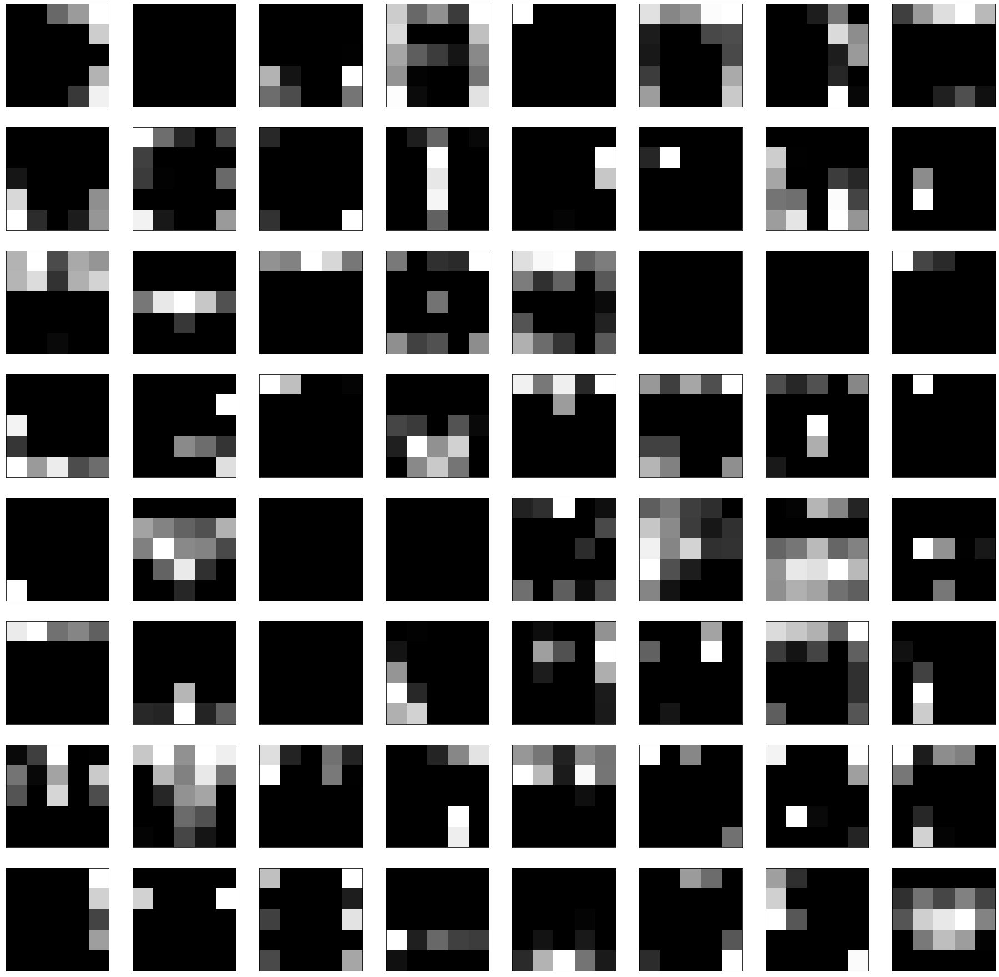

In [48]:
ixs = [2, 5, 10, 15]
outputs = [vgg.layers[i].output for i in ixs]
model = tf.keras.Model(inputs=[vgg.input], outputs=outputs)
feature_maps = model.predict(content_image)

square = 8
for i, fmap in enumerate(feature_maps):
    ix = 1
    print(outputs[i])
    plt.figure(figsize=(32,32))
    for _ in range(square):
        for _ in range(square):
            ax = pyplot.subplot(square, square, ix)
            ax.set_xticks([])
            ax.set_yticks([])
            pyplot.imshow(fmap[0, :, :, ix-1], cmap='gray')
            ix += 1
    pyplot.show()

# Filter Visualization of New Model

In [49]:
model = model
for i in range(len(model.layers)):
    layer = model.layers[i]
    if 'conv' not in layer.name:
        continue
    print(i, layer.name, layer.output.shape)

1 block1_conv1 (None, 80, 80, 64)
2 block1_conv2 (None, 80, 80, 64)
4 block2_conv1 (None, 40, 40, 128)
5 block2_conv2 (None, 40, 40, 128)
7 block3_conv1 (None, 20, 20, 256)
8 block3_conv2 (None, 20, 20, 256)
9 block3_conv3 (None, 20, 20, 256)
11 block4_conv1 (None, 10, 10, 512)
12 block4_conv2 (None, 10, 10, 512)
13 block4_conv3 (None, 10, 10, 512)
15 block5_conv1 (None, 5, 5, 512)


In [50]:
def load_img(path_to_img):
    max_dim = 512
    img = tf.io.read_file(path_to_img)
    img = tf.image.decode_image(img, channels=3)
    img = tf.image.convert_image_dtype(img, tf.float32)

    shape = tf.cast(tf.shape(img)[:-1], tf.float32)
    long_dim = max(shape)
    scale = max_dim / long_dim

    new_shape = tf.cast(shape * scale, tf.int32)

    img = tf.image.resize(img, new_shape)
    img = img[tf.newaxis, :]
    
    return img

In [51]:
def imshow(image, title=None):
    if len(image.shape) > 3:
        image = tf.squeeze(image, axis=0)

    plt.imshow(image)
    if title:
        plt.title(title)

Image shape: (1, 512, 512, 3)


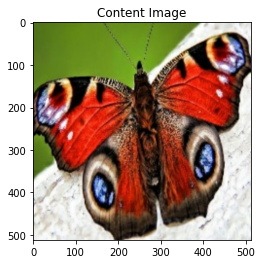

In [52]:
content_path = 'F:/AIUB/CPVR/dataset/butterfly/butterflies/train/peacock/65.jpg'
content_image = load_img(content_path)
print('Image shape:', content_image.shape)
imshow(content_image, 'Content Image')

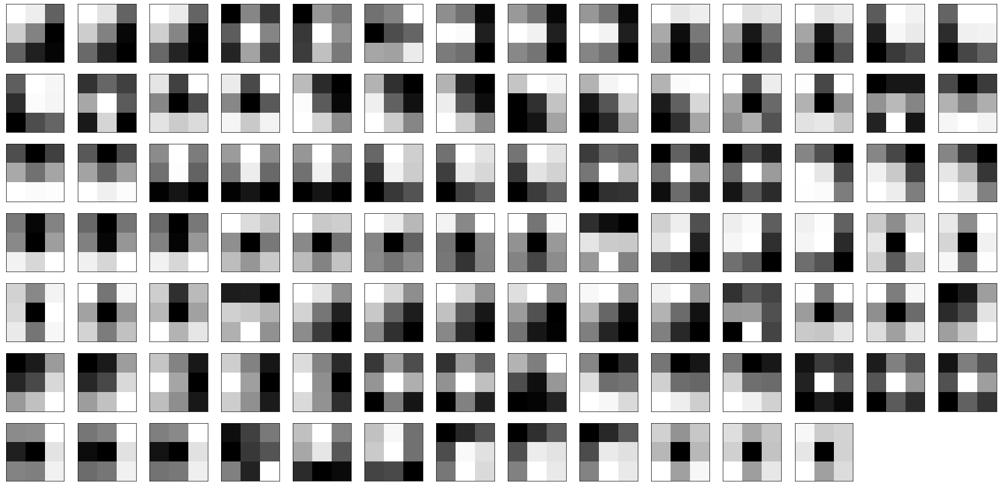

In [53]:
plt.figure(figsize=(32,32))

filters, biases = model.layers[1].get_weights()

f_min, f_max = filters.min(), filters.max()
filters = (filters - f_min) / (f_max - f_min)

n_filters, ix = 32, 1

for i in range(n_filters):
    f = filters[:, :, :, i]
    for j in range(3):
        ax = pyplot.subplot(14, 14, ix)
        ax.set_xticks([])
        ax.set_yticks([])
        pyplot.imshow(f[:, :, j], cmap='gray')
        ix += 1
pyplot.show()

Model: "model_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 80, 80, 3)]       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 80, 80, 64)        1792      
Total params: 1,792
Trainable params: 0
Non-trainable params: 1,792
_________________________________________________________________


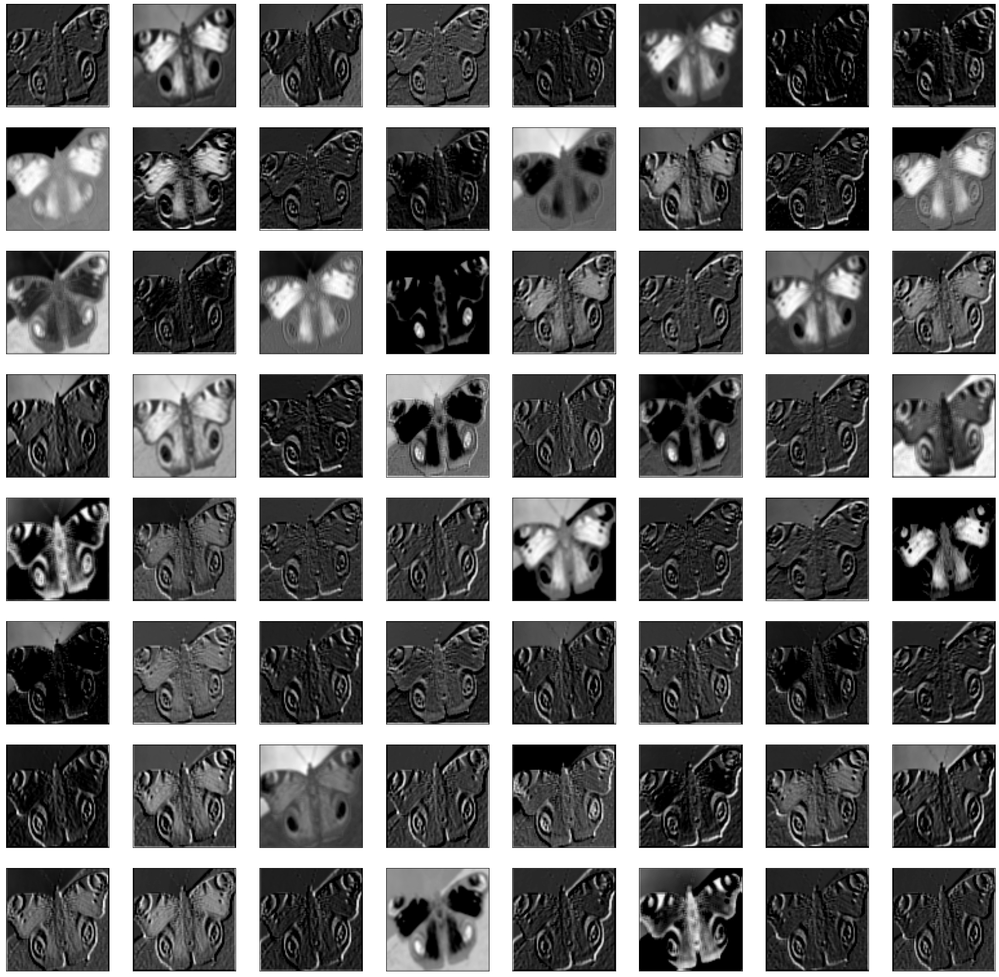

In [54]:
plt.figure(figsize=(32,32))

model = tf.keras.Model(inputs=[model.input], outputs=model.layers[1].output)
model.summary()

content_image = load_img(content_path)
content_image = tf.image.resize(content_image, (80, 80))

feature_maps = model.predict(content_image)
square = 8
ix = 1
for _ in range(square):
    for _ in range(square):
        ax = pyplot.subplot(square, square, ix)
        ax.set_xticks([])
        ax.set_yticks([])
        pyplot.imshow(feature_maps[0, :, :, ix-1], cmap='gray')
        ix += 1
        
pyplot.show()